均线 一

我是 格子衫小C ，一个典型的理工男。

今天开始，我们一起来研究均线。

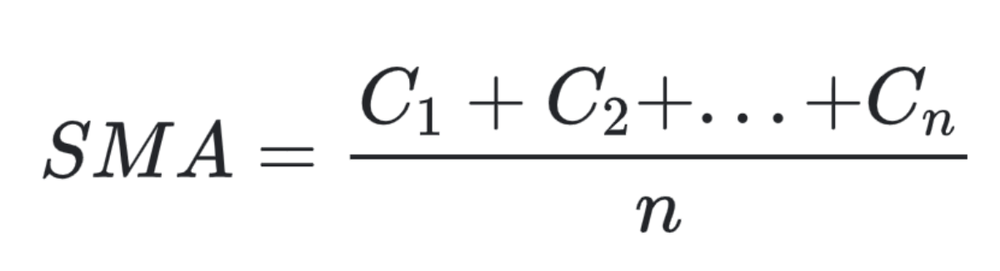

均线是最常见的一种指标，一般交易软件里都能看到。

均线，顾名思义，就是用各种加权算法算出历史平均价格。

因为均线有明显的滞后性，所以一般叫 移动平均线，也就是 Moving Averages ，简称 MA。

MA里，平均数的算法有很多种，因此MA也有很多种，其中，最简单的就是算术平均数算出来的，一般叫 MA 或 SMA。

In [1]:
import pandas as pd
from datetime import datetime
import trdb2py

isStaticImg = False
width = 960
height = 768

pd.options.display.max_columns = None
pd.options.display.max_rows = None

trdb2cfg = trdb2py.loadConfig('./trdb2.yaml')

In [2]:
# 具体基金
# asset = 'jrj.510310'
asset = 'jqdata.000300_XSHG|1d'

# 起始时间，0表示从最开始算起
# tsStart = 0
tsStart = int(trdb2py.str2timestamp('2013-05-01', '%Y-%m-%d'))

# 结束时间，-1表示到现在为止
# tsEnd = -1
tsEnd = int(trdb2py.str2timestamp('2020-09-30', '%Y-%m-%d'))

# 初始资金池
paramsinit = trdb2py.trading2_pb2.InitParams(
    money=10000,
)

# 买入参数，用全部的钱来买入（也就是复利）
paramsbuy = trdb2py.trading2_pb2.BuyParams(
    perHandMoney=1,
)

# 卖出参数，全部卖出
paramssell = trdb2py.trading2_pb2.SellParams(
    perVolume=1,
)

In [3]:
# baseline    
s0 = trdb2py.trading2_pb2.Strategy(
    name="normal",
    asset=trdb2py.str2asset(asset),         
)
        
buy0 = trdb2py.trading2_pb2.CtrlCondition(
    name='buyandhold',
)

paramsbuy = trdb2py.trading2_pb2.BuyParams(
    perHandMoney=1,
)

paramsinit = trdb2py.trading2_pb2.InitParams(
    money=10000,
)

s0.buy.extend([buy0])
s0.paramsBuy.CopyFrom(paramsbuy)
s0.paramsInit.CopyFrom(paramsinit)        
p0 = trdb2py.trading2_pb2.SimTradingParams(
    assets=[trdb2py.str2asset(asset)],
    startTs=tsStart,
    endTs=tsEnd,
    strategies=[s0],
    title='baseline',
)  

pnlBaseline = trdb2py.simTrading(trdb2cfg, p0)
trdb2py.showPNL(pnlBaseline, toImg=isStaticImg, width=width, height=height)

我们还是拿沪深300指数，2013年5月1日到2020年9月30日的日线数据来做例子。

In [4]:
ret = trdb2py.getAssetCandles2(trdb2cfg, asset, tsStart, tsEnd, indicators=['sma.2', 'sma.5', 'sma.30', 'sma.60'])
trdb2py.showAssetCandles2('沪深300指数', ret, indicators=['sma.2', 'sma.5', 'sma.30', 'sma.60'], toImg=isStaticImg, width=width, height=height)

上面可以看到30日、60日、120日、240日均线，可以看到，随着容纳的数据变多，均线是越来越平滑的。

1. 越大的均线越平滑
2. 越大的均线高点越低，低点越高
3. 越长的均线滞后性越明显

将均线和价格曲线对比来看，我们能发现

1. 上涨时，价格曲线在均线上方（均线的滞后性）
2. 下跌时，价格曲线在下方

看起来，只要找到一条合适的均线，在价格向上穿过均线时买入，价格向下穿过均线时卖出，但其实没这么简单。

越长的均线相交点越少，但滞后越严重，而越短的均线，很容易有误穿的情况。

而且，理论上，这个均线参数不会适用所有情况，哪怕是一种资产的均线。

接下来，测一下均线

In [5]:
lstparams = []

# 具体基金
# asset = 'jrj.510310'
asset = 'jqdata.000300_XSHG|1d'

# 起始时间，0表示从最开始算起
# tsStart = 0
tsStart = int(trdb2py.str2timestamp('2013-05-01', '%Y-%m-%d'))

# 结束时间，-1表示到现在为止
# tsEnd = -1
tsEnd = int(trdb2py.str2timestamp('2020-09-30', '%Y-%m-%d'))

for ema in range(2, 241):    
    buy0 = trdb2py.trading2_pb2.CtrlCondition(
        name='indicatorsp',
        operators=['upcross'],
        strVals=['ta-sma.{}'.format(ema)],
    )
    
    buy1 = trdb2py.trading2_pb2.CtrlCondition(
        name='waittostart',
        vals=[ema],
    )    
            
    sell0 = trdb2py.trading2_pb2.CtrlCondition(
        name='indicatorsp',
        operators=['downcross'],
        strVals=['ta-sma.{}'.format(ema)],
    )
    
    s0 = trdb2py.trading2_pb2.Strategy(
        name="normal",
        asset=trdb2py.str2asset(asset),
    )

    s0.buy.extend([buy0, buy1])
    s0.sell.extend([sell0])
    s0.paramsBuy.CopyFrom(paramsbuy)
    s0.paramsSell.CopyFrom(paramssell) 
    s0.paramsInit.CopyFrom(paramsinit)        
    lstparams.append(trdb2py.trading2_pb2.SimTradingParams(
        assets=[trdb2py.str2asset(asset)],
        startTs=tsStart,
        endTs=tsEnd,
        strategies=[s0],
        title='sma.{}'.format(ema),
    ))
 
lstpnlmix = trdb2py.simTradings(trdb2cfg, lstparams, ignoreTotalReturn=2.3)

trdb2py.showPNLs(lstpnlmix + [pnlBaseline], toImg=isStaticImg, width=width, height=height)

In [6]:
dfpnl = trdb2py.buildPNLReport(lstpnlmix + [pnlBaseline])

# dfpnl1 = dfpnl[dfpnl['totalReturns'] >= 2]

dfpnl[['title', 'maxDrawdown', 'maxDrawdownStart', 'maxDrawdownEnd', 'totalReturns', 'sharpe', 'annualizedReturns', 'annualizedVolatility', 'variance']].sort_values(by='totalReturns', ascending=False)

,title,maxDrawdown,maxDrawdownStart,maxDrawdownEnd,totalReturns,sharpe,annualizedReturns,annualizedVolatility,variance
8,sma.135,0.302877,2015-06-08,2016-08-01,2.526526,1.124235,0.205786,0.156360,0.224423
7,sma.134,0.302877,2015-06-08,2016-08-01,2.464083,1.071079,0.197368,0.156261,0.210389
6,sma.133,0.302266,2015-06-08,2016-08-01,2.416803,1.030181,0.190994,0.156278,0.198287
9,sma.136,0.334525,2015-06-08,2016-08-01,2.405653,1.011514,0.189491,0.157676,0.189818
10,sma.137,0.336601,2015-06-08,2016-08-01,2.398148,1.005086,0.188480,0.157678,0.187792
2,sma.42,0.205037,2019-04-19,2020-05-22,2.377462,1.034221,0.185691,0.150539,0.210880
0,sma.35,0.258460,2015-06-08,2016-06-27,2.359716,1.006630,0.183299,0.152289,0.177686
4,sma.120,0.291283,2015-06-08,2016-06-29,2.344876,0.960273,0.181298,0.157557,0.202396
11,sma.141,0.340096,2015-06-08,2016-08-01,2.333954,0.929030,0.179826,0.161271,0.180135
3,sma.119,0.291283,2015-06-08,2016-06-28,2.323125,0.941141,0.178366,0.157645,0.198906


可以看到，简单的均线策略，最好的情况也就是将上涨的趋势把握住，跳过下跌大的区间，当然，基本上上涨和下跌都会有损失。

这里粒度非常重要，看估计很难看出来，只能试。

In [7]:
# lstems = [2, 42, 60]
# 起始时间，0表示从最开始算起
tsStart = 0
# tsStart = int(trdb2py.str2timestamp('2013-05-01', '%Y-%m-%d'))

# 结束时间，-1表示到现在为止
tsEnd = -1
# tsEnd = int(trdb2py.str2timestamp('2020-09-30', '%Y-%m-%d'))

# baseline    
s0 = trdb2py.trading2_pb2.Strategy(
    name="normal",
    asset=trdb2py.str2asset(asset),         
)
        
buy0 = trdb2py.trading2_pb2.CtrlCondition(
    name='buyandhold',
)

paramsbuy = trdb2py.trading2_pb2.BuyParams(
    perHandMoney=1,
)

paramsinit = trdb2py.trading2_pb2.InitParams(
    money=10000,
)

s0.buy.extend([buy0])
s0.paramsBuy.CopyFrom(paramsbuy)
s0.paramsInit.CopyFrom(paramsinit)        
p0 = trdb2py.trading2_pb2.SimTradingParams(
    assets=[trdb2py.str2asset(asset)],
    startTs=tsStart,
    endTs=tsEnd,
    strategies=[s0],
    title='baseline',
)  

pnlBaselineF = trdb2py.simTrading(trdb2cfg, p0)
trdb2py.showPNL(pnlBaselineF, toImg=isStaticImg, width=width, height=height)

In [8]:
lstparams = []

lstems = [2, 35, 42, 60, 135, 197, 240]
# 起始时间，0表示从最开始算起
tsStart = 0
# tsStart = int(trdb2py.str2timestamp('2013-05-01', '%Y-%m-%d'))

# 结束时间，-1表示到现在为止
tsEnd = -1
# tsEnd = int(trdb2py.str2timestamp('2020-09-30', '%Y-%m-%d'))

for ema in lstems:    
    buy0 = trdb2py.trading2_pb2.CtrlCondition(
        name='indicatorsp',
        operators=['upcross'],
        strVals=['ta-sma.{}'.format(ema)],
    )
    
    buy1 = trdb2py.trading2_pb2.CtrlCondition(
        name='waittostart',
        vals=[ema],
    )    
            
    sell0 = trdb2py.trading2_pb2.CtrlCondition(
        name='indicatorsp',
        operators=['downcross'],
        strVals=['ta-sma.{}'.format(ema)],
    )
    
    s0 = trdb2py.trading2_pb2.Strategy(
        name="normal",
        asset=trdb2py.str2asset(asset),
    )

    s0.buy.extend([buy0, buy1])
    s0.sell.extend([sell0])
    s0.paramsBuy.CopyFrom(paramsbuy)
    s0.paramsSell.CopyFrom(paramssell) 
    s0.paramsInit.CopyFrom(paramsinit)        
    lstparams.append(trdb2py.trading2_pb2.SimTradingParams(
        assets=[trdb2py.str2asset(asset)],
        startTs=tsStart,
        endTs=tsEnd,
        strategies=[s0],
        title='sma.{}'.format(ema),
    ))
 
lstpnlmix = trdb2py.simTradings(trdb2cfg, lstparams, ignoreTotalReturn=2.3)

trdb2py.showPNLs(lstpnlmix + [pnlBaselineF], toImg=isStaticImg, width=width, height=height)

In [9]:
dfpnl = trdb2py.buildPNLReport(lstpnlmix + [pnlBaselineF])

# dfpnl1 = dfpnl[dfpnl['totalReturns'] >= 2]

dfpnl[['title', 'maxDrawdown', 'maxDrawdownStart', 'maxDrawdownEnd', 'totalReturns', 'sharpe', 'annualizedReturns', 'annualizedVolatility', 'variance']].sort_values(by='totalReturns', ascending=False)

,title,maxDrawdown,maxDrawdownStart,maxDrawdownEnd,totalReturns,sharpe,annualizedReturns,annualizedVolatility,variance
2,sma.42,0.317224,2008-01-14,2009-01-15,18.853304,6.173806,1.115831,0.175877,28.218082
4,sma.135,0.378201,2009-08-03,2014-07-22,14.226703,4.323498,0.826669,0.184265,11.027161
1,sma.35,0.276939,2008-01-14,2008-11-28,14.077395,4.450345,0.817337,0.176916,13.685123
5,sma.197,0.358136,2009-08-03,2014-07-25,12.492496,3.649908,0.718281,0.188575,8.780359
3,sma.60,0.411195,2009-08-03,2012-12-13,11.943425,3.683646,0.683964,0.177532,11.890634
6,sma.240,0.386300,2009-08-03,2014-08-28,8.574028,2.315743,0.473377,0.191462,3.747662
7,baseline,0.723038,2007-10-16,2008-11-04,5.131249,0.856241,0.258269,0.266595,1.128936
0,sma.2,0.424350,2008-01-14,2008-11-07,4.653762,1.051189,0.228360,0.188701,0.921770
